# Workshop #7. Batch-correction and label transfer

In [1]:
!pip install scanpy[leiden] harmonypy symphonypy
!gdown "1jW548g6ERFS0t7NywgyjRs6VaE5QwXbg&confirm=T"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.4/124.4 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 3.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 6.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 18.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 11.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.8/79.8 kB 5.8 MB/s eta 0:00:00
  Created wheel for session-info: filename=session_info-1.0.0-py3-none-any.whl size=8026 sha256=b353fe34b5617c213c1d21f021c9d08725cc952d7ee463e4f7de196b21ea05de
  Stored in directory: /root/.cache/pip/wheels/6a/aa/b9/eb5d4031476ec10802795b97ccf937b9bd998d68a9b268765a
Successfully built session-info
Downloading...
From: https://drive.google.com/uc?id=1jW548g6ERFS0t7NywgyjRs6VaE5QwXbg&confirm=T
To: /

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import scanpy as sc
import scanpy.external as sce

sns.set_style("ticks") # style
sc.settings.verbosity = 3 # amount of output
sc.set_figure_params(dpi=150)

## QC

In [3]:
adata = sc.read_h5ad("PBMC_Satija.h5ad")
del (
    adata.obs["celltype.l3"],
    adata.obs["Phase"],
    adata.obs["time"],
    adata.obs["lane"],
)

In [4]:
adata.var["mt"] = adata.var.index.str.startswith("MT-")
sc.pp.calculate_qc_metrics(
    adata,
    qc_vars=["mt"],
    percent_top=None,
    inplace=True,
    log1p=False,
)

In [5]:
adata = adata[adata.obs.n_genes_by_counts >= 700]
adata

View of AnnData object with n_obs × n_vars = 17144 × 20729
    obs: 'orig.ident', 'donor', 'celltype.l1', 'celltype.l2', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [6]:
sc.pp.scrublet(adata, batch_key="donor")
adata = adata[adata.obs.doublet_score <= 0.2]

Running Scrublet
filtered out 3864 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:21)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
Embedding transcriptomes using PCA...
    using data matrix X directly
Automatically set threshold at doublet score = 0.43
Detected doublet rate = 0.3%
Estimated detectable doublet fraction = 43.8%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 0.6%
filtered out 4568 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata

In [7]:
adata_raw = adata.copy()

## Data transformation

In [ ]:
adata_counts = adata.copy()

In [ ]:
adata = adata_counts.copy()

sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, batch_key="donor", n_top_genes=3000)

adata.raw = adata
adata = adata[:, adata.var.highly_variable]
sc.pp.scale(adata, max_value=10)

In [ ]:
sc.pp.pca(adata, n_comps=20)

computing PCA
    with n_comps=20
    finished (0:00:07)


In [ ]:
sc.pp.neighbors(adata)
sc.tl.leiden(adata)
sc.tl.umap(adata)

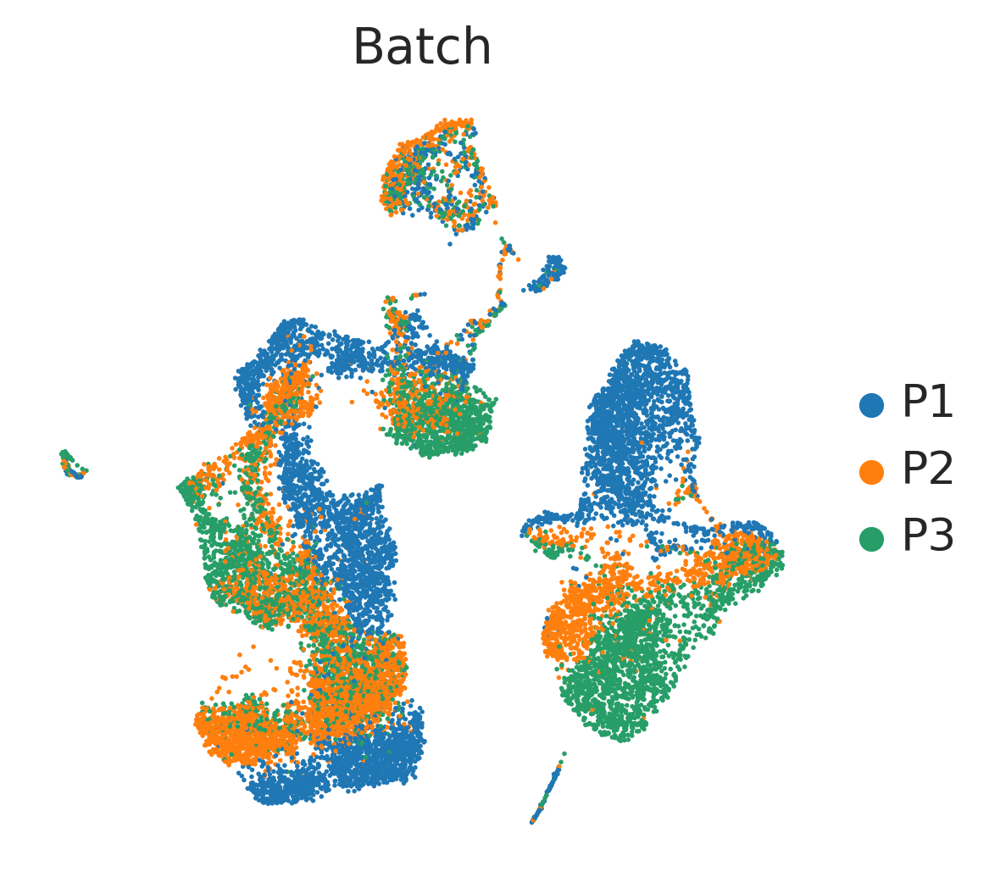

In [ ]:
sc.pl.umap(adata, color="donor", frameon=False, title="Batch")

In [ ]:
sce.pp.harmony_integrate(adata, key="donor", max_iter_harmony=30)

2024-04-24 12:50:51,415 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...
2024-04-24 12:50:56,462 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2024-04-24 12:50:56,589 - harmonypy - INFO - Iteration 1 of 30
INFO:harmonypy:Iteration 1 of 30
2024-04-24 12:51:05,405 - harmonypy - INFO - Iteration 2 of 30
INFO:harmonypy:Iteration 2 of 30
2024-04-24 12:51:13,564 - harmonypy - INFO - Iteration 3 of 30
INFO:harmonypy:Iteration 3 of 30
2024-04-24 12:51:21,809 - harmonypy - INFO - Iteration 4 of 30
INFO:harmonypy:Iteration 4 of 30
2024-04-24 12:51:30,063 - harmonypy - INFO - Iteration 5 of 30
INFO:harmonypy:Iteration 5 of 30
2024-04-24 12:51:31,901 - harmonypy - INFO - Converged after 5 iterations
INFO:harmonypy:Converged after 5 iterations


In [ ]:
sc.pp.neighbors(adata, use_rep="X_pca_harmony")
sc.tl.leiden(adata)
sc.tl.umap(adata)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:05)
running Leiden clustering
    finished: found 20 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:15)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:17)


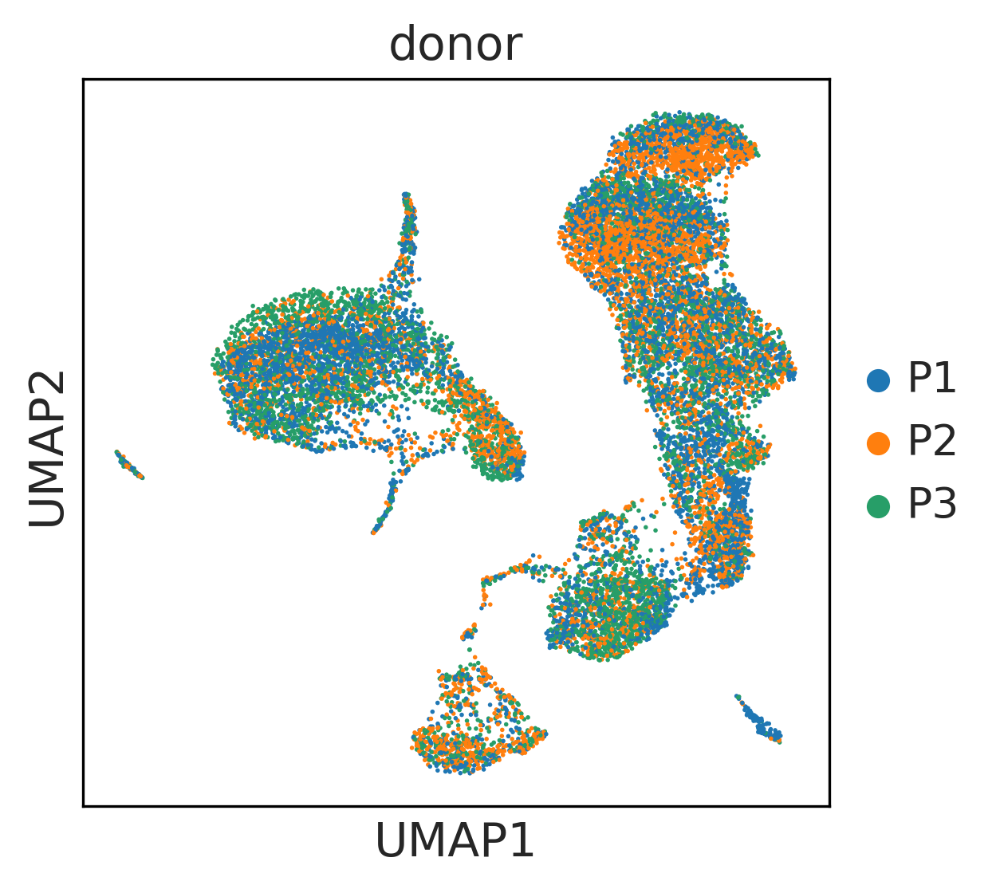

In [ ]:
sc.pl.umap(adata, color="donor")

## Manual cell type identification

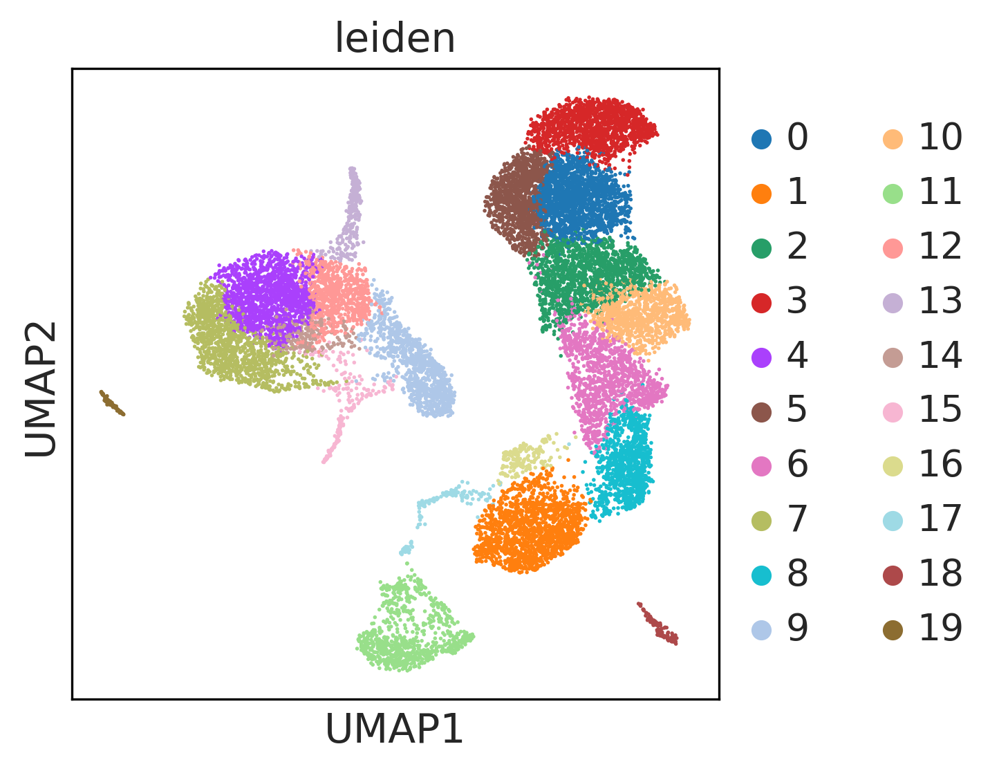

In [ ]:
sc.pl.umap(adata, color="leiden")

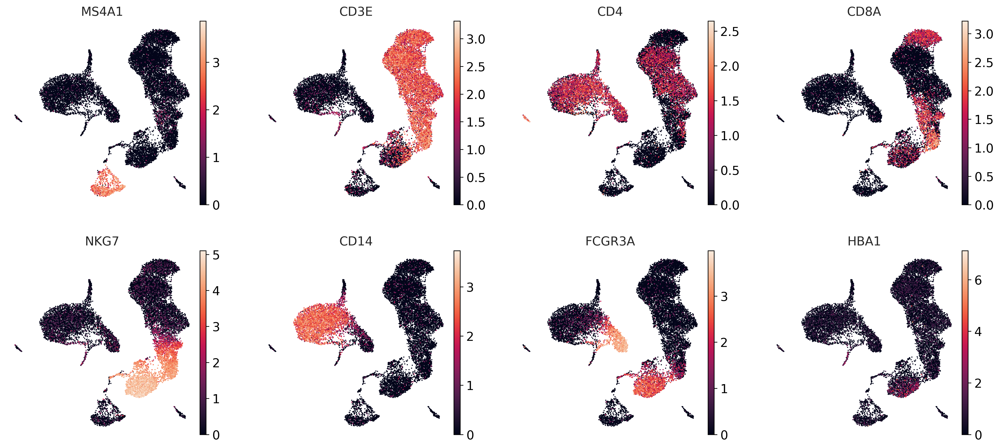

In [ ]:
sc.pl.umap(adata, color=["MS4A1", "CD3E", "CD4", "CD8A", "NKG7", "CD14", "FCGR3A", "HBA1"], frameon=False)

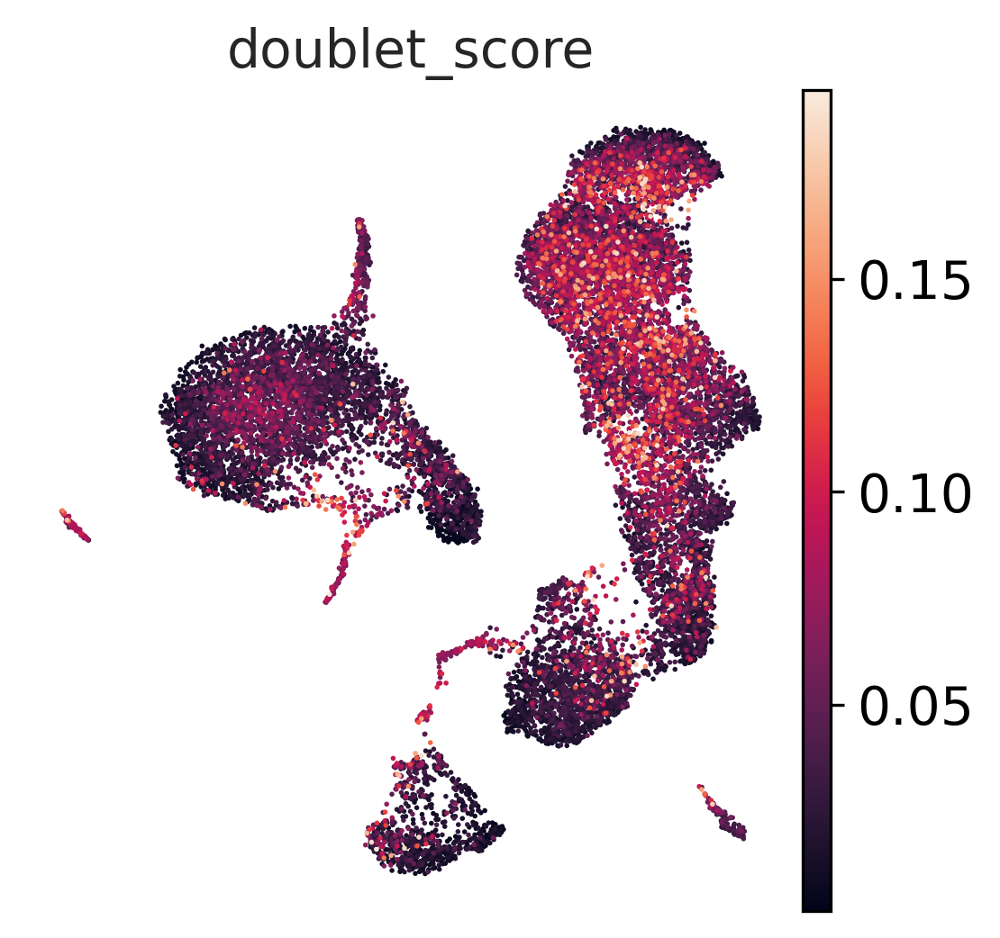

In [ ]:
sc.pl.umap(adata, color=["doublet_score"], frameon=False)

## Marker genes identification

In [ ]:
sc.tl.rank_genes_groups(adata, groupby="leiden", method="wilcoxon")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:43)


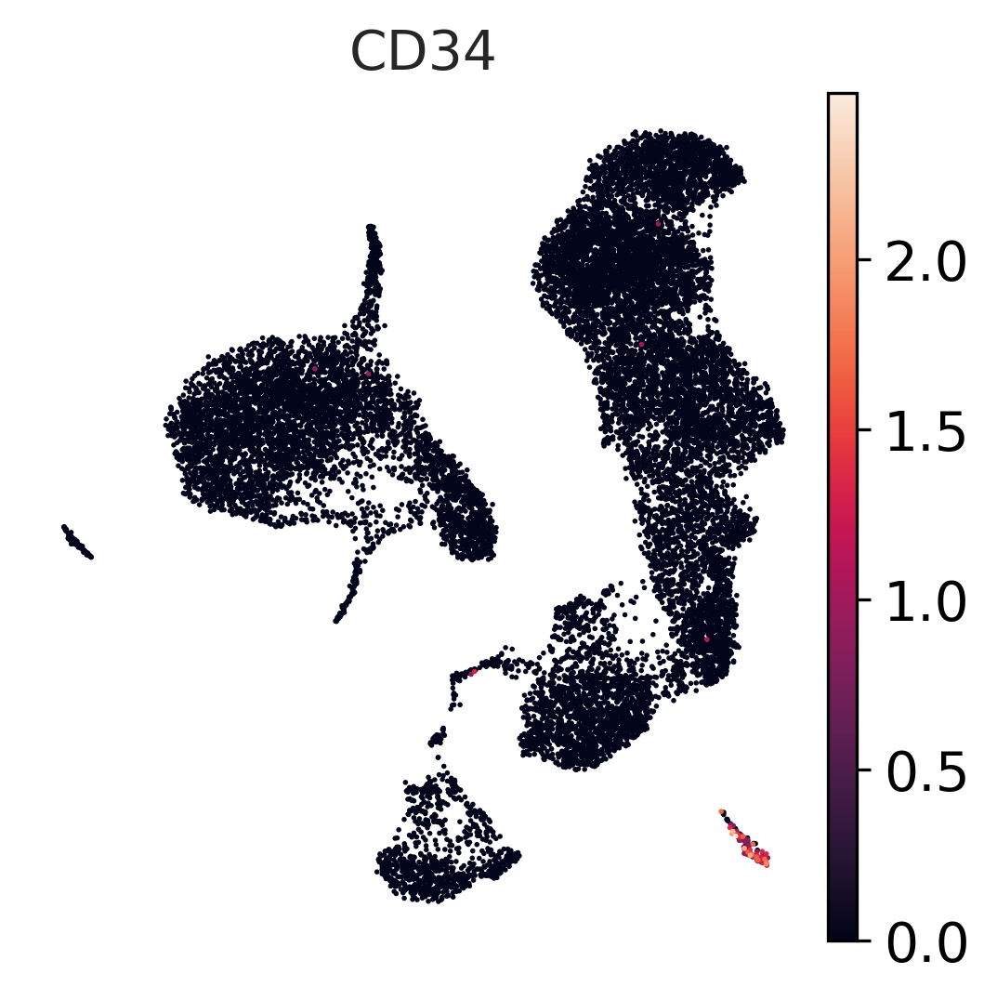

In [ ]:
sc.pl.umap(adata, color=["CD34"], frameon=False)

In [ ]:
df = sc.get.rank_genes_groups_df(adata, group="15")
df[df.logfoldchanges > 6].head(10)

,names,scores,logfoldchanges,pvals,pvals_adj
0,PPBP,24.403379,10.306451,1.574606e-131,3.264000e-127
1,PF4,24.024967,9.906702,1.525281e-127,1.580878e-123
2,NRGN,23.807009,6.719131,2.825786e-125,1.952524e-121
3,GNG11,23.382982,9.194095,6.367821e-121,3.299964e-117
4,CAVIN2,23.190170,9.450546,5.721677e-119,2.372093e-115
5,TUBB1,22.363956,10.008342,8.832415e-111,3.051452e-107
6,CLU,21.503010,8.063581,1.459093e-102,4.320791e-99
10,PRKAR2B,20.461206,7.551603,4.774182e-93,8.996729e-90
11,HIST1H2AC,20.251434,6.265240,3.450491e-91,5.960436e-88
22,SPARC,18.026823,8.531977,1.199897e-72,6.722342e-70


## Label transfer

In [ ]:
import symphonypy as sp

adata_reference = sp.datasets.pbmcs_10x_reference()

try downloading from url
https://zenodo.org/record/7607565/files/pbmcs_10x_reference.h5ad
... this may take a while but only happens once
creating directory data/symphony_ref/ for saving data


  0%|          | 0.00/38.9M [00:00<?, ?B/s]

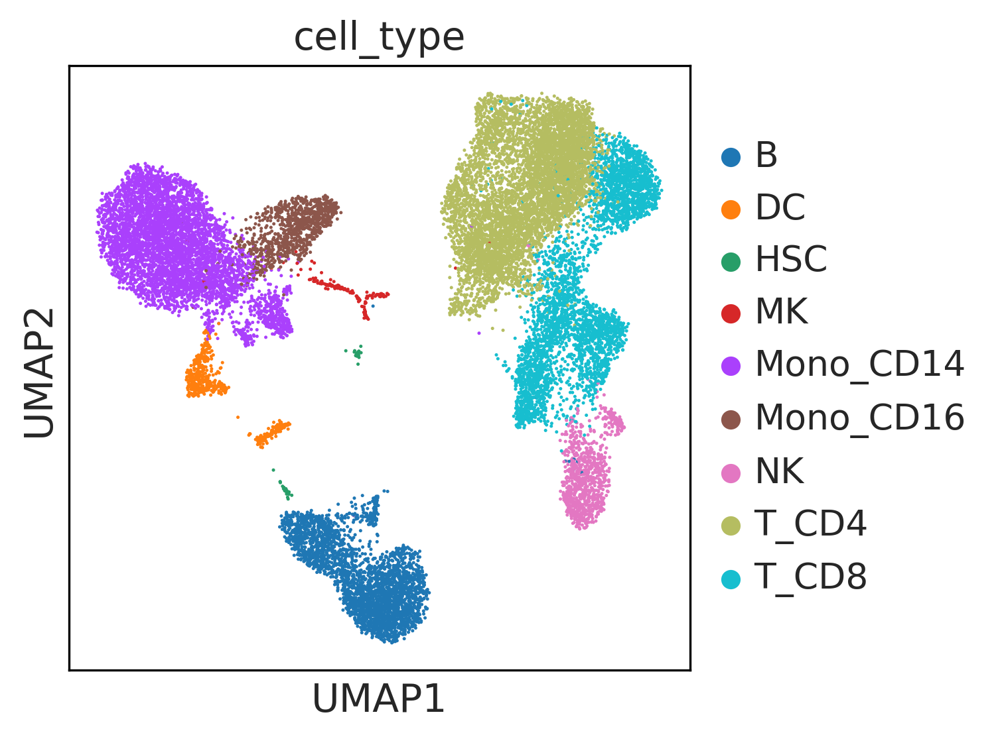

In [ ]:
sc.pl.umap(adata_reference, color="cell_type")

In [ ]:
adata_query = adata.raw.to_adata()
adata_query

AnnData object with n_obs × n_vars = 16991 × 20729
    obs: 'orig.ident', 'donor', 'celltype.l1', 'celltype.l2', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'doublet_score', 'predicted_doublet', 'leiden'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'scrublet', 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'donor_colors', 'leiden_colors', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap', 'X_pca_harmony'
    obsp: 'distances', 'connectivities'

In [ ]:
sp.tl.map_embedding(adata_query, adata_reference, key="donor")

In [ ]:
sp.tl.map_embedding(adata_query, adata_reference, key="donor")
sp.tl.per_cell_confidence(adata_query, adata_reference)
sp.tl.transfer_labels_kNN(adata_query, adata_reference, ref_labels=["cell_type"])

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


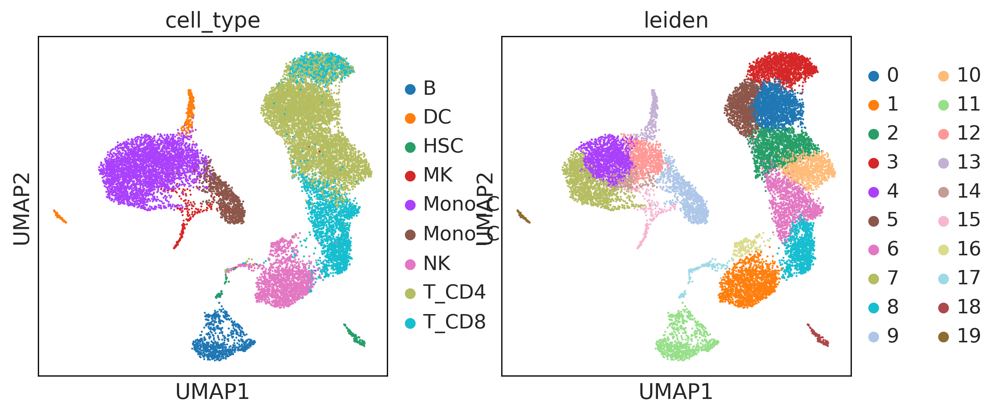

In [ ]:
sc.pl.umap(adata_query, color=["cell_type", "leiden"])

In [ ]:
adata_query.obs

,orig.ident,donor,celltype.l1,celltype.l2,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,n_genes,doublet_score,predicted_doublet,leiden,symphony_per_cell_dist,cell_type
L1_AAACCCACATCAGTCA,P3_3,P3,CD8 T,CD8 TEM,1632,4938.0,269.0,5.447550,1632,0.027080,False,6,3.615343,T_CD8
L1_AAACCCATCCACACCT,P3_3,P3,CD8 T,CD8 Naive,1217,4724.0,249.0,5.270957,1217,0.018742,False,3,5.088089,T_CD8
L1_AAACCCATCTGCGGAC,P1_0,P1,CD4 T,CD4 TCM,1318,5060.0,380.0,7.509881,1318,0.034213,False,10,4.794912,T_CD4
L1_AAACCCATCTTAAGGC,P2_3,P2,CD4 T,CD4 CTL,1451,4643.0,234.0,5.039845,1451,0.091633,False,6,5.448840,T_CD8
L1_AAACGAAAGATAACAC,P2_3,P2,B,B naive,1099,4496.0,323.0,7.184164,1099,0.021659,False,11,3.816291,B
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
L5_TTTGTTGGTACGATCT,P2_3,P2,NK,NK,1596,4489.0,315.0,7.017153,1596,0.051248,False,1,3.460459,NK
L5_TTTGTTGGTGGTCTGC,P1_0,P1,Mono,CD14 Mono,1554,4887.0,384.0,7.857581,1554,0.022556,False,7,4.597720,Mono_CD14
L5_TTTGTTGTCAACACCA,P2_3,P2,Mono,CD14 Mono,2214,6274.0,322.0,5.132292,2214,0.021659,False,4,4.569419,Mono_CD14
L5_TTTGTTGTCATGCATG,P2_3,P2,CD8 T,CD8 Naive,1472,5266.0,276.0,5.241170,1472,0.037197,False,3,5.188455,T_CD4


In [ ]:
adata_query_umap = adata_query.copy()
sp.tl.ingest(adata_query_umap, adata_reference)

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


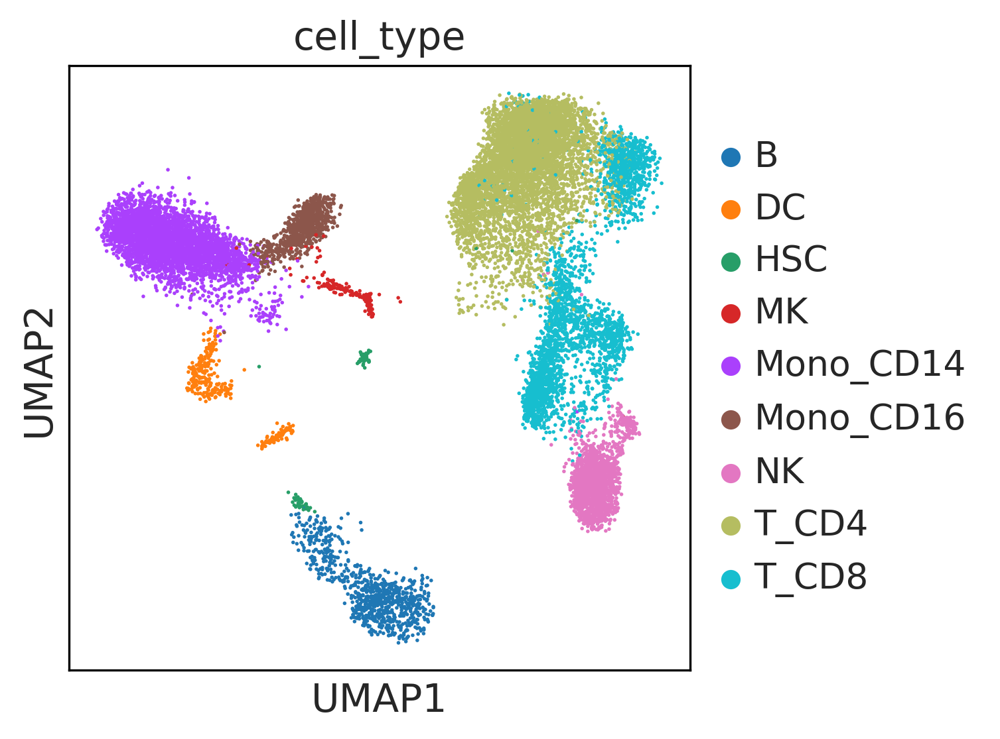

In [ ]:
sc.pl.umap(adata_query_umap, color="cell_type")

In [ ]:
leiden_to_ct = {
    "0": "Cell type 1",

}

adata.obs["cell_type_annotation"] = [leiden_to_ct[leiden] for leiden in adata.obs.leiden]
sc.pl.umap(adata, color=["cell_type_annotation", "celltype.l1"], frameon=False, wspace=0.3)

# Hometask

## Task 1

Try to integrate the dataset from the workshop with following techniques:
1. scanorama,
2. BBKNN,
3. scVI,
4. combat.

Which method works better, which — worse? Please motivate your answer.

### scanorama

In [ ]:
!pip install git+https://github.com/theislab/scanpy.git
!pip install git+https://github.com/theislab/anndata.git
!pip install scanorama

  Cloning https://github.com/theislab/scanpy.git to /tmp/pip-req-build-rv_8vyx8
  Running command git clone --filter=blob:none --quiet https://github.com/theislab/scanpy.git /tmp/pip-req-build-rv_8vyx8
  Resolved https://github.com/theislab/scanpy.git to commit b918a23eb77462837df90d7b3a30a573989d4d48
  Running command git submodule update --init --recursive -q
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for scanpy: filename=scanpy-1.10.0rc2.dev85+gb918a23e-py3-none-any.whl size=2084881 sha256=828c2dc8488ba61856db2aba9903262416b5e2ceae0f66c42c16899751683756
  Stored in directory: /tmp/pip-ephem-wheel-cache-k91mmo6x/wheels/0c/3d/ac/0645ab8f6a27d0110d2b16dfd27f9348170a7b8b2ec6b59545
Successfully built scanpy
  Attempting uninstall: scanpy
    Found existing installation: scanpy 1.10.2
    Uninstalling scanpy-1.10.2:
      Successfully uninstalled scanpy-1.10.2
  Cloning https://gith

In [ ]:
import scanorama

In [ ]:
adata = adata_raw.copy()

In [ ]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000, inplace=True)

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [ ]:
#sc.pp.pca(adata, n_comps=20)

computing PCA
    with n_comps=20
    finished (0:00:01)


In [ ]:
corrected = scanorama.correct_scanpy([adata[adata.obs['donor'] == "P1"],adata[adata.obs['donor'] == "P2"],adata[adata.obs['donor'] == "P3"]]) #adata[adata.obs['donor'] == "P3"]

Found 20729 genes among all datasets
[[0.         0.76328578 0.29173852]
 [0.         0.         0.82687287]
 [0.         0.         0.        ]]
Processing datasets (1, 2)
Processing datasets (0, 1)


In [ ]:
adata_correct = sc.concat(
    adatas,
    label="library_id",
    uns_merge="unique",
    keys=[
        k
        for d in [
            adatas_cor[0].uns["spatial"],
            adatas_cor[1].uns["spatial"],
        ]
        for k, v in d.items()
    ],
    index_unique="-",
)

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

Просто не хватает оперативки в коллабе :(
  

### BBKNN

In [ ]:
adata = adata_raw.copy()

In [ ]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000, inplace=True)
sc.pp.pca(adata, n_comps=20)


normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    with n_comps=20
    finished (0:00:01)


computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:07)
running Leiden clustering
    finished: found 21 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:08)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:15)


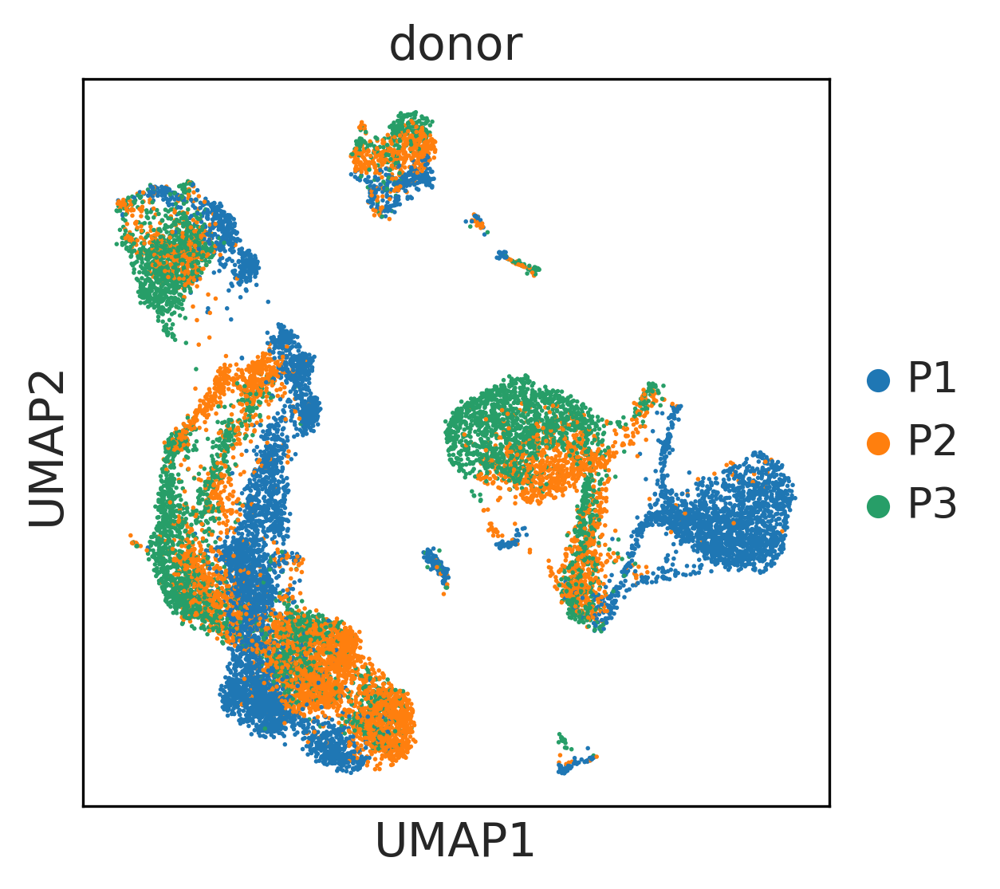

In [ ]:
sc.pp.neighbors(adata)
sc.tl.leiden(adata)
sc.tl.umap(adata)
sc.pl.umap(adata, color="donor")

In [ ]:
!pip install bbknn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 647.5/647.5 kB 9.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for annoy: filename=annoy-1.17.3-cp310-cp310-linux_x86_64.whl size=552448 sha256=da42a85232281d29be50df8eae05849b3e63b42d327ab48b1e995c035c76dd28
  Stored in directory: /root/.cache/pip/wheels/64/8a/da/f714bcf46c5efdcfcac0559e63370c21abe961c48e3992465a
Successfully built annoy


In [ ]:
import bbknn
bbknn.bbknn(adata, batch_key='donor')

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)


computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:27)


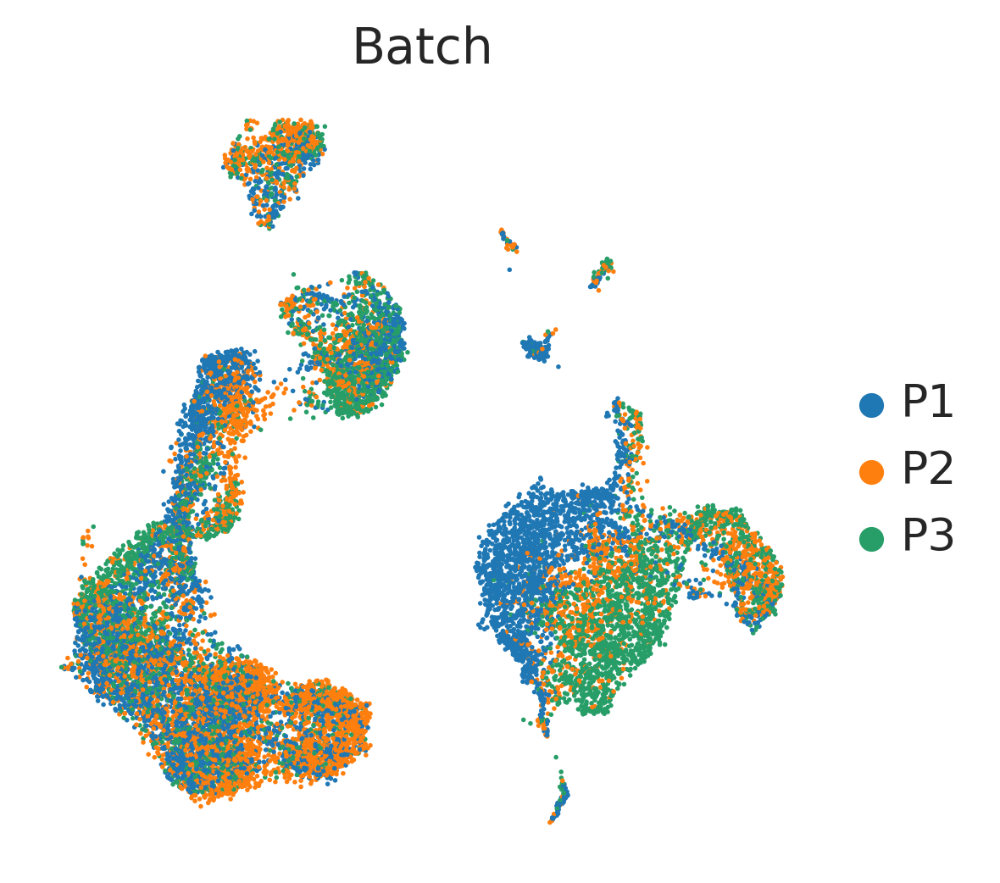

In [ ]:
sc.tl.umap(adata)
sc.pl.umap(adata, color="donor", frameon=False, title="Batch")

### scVI

In [ ]:
adata = adata_raw.copy()
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000, inplace=True)
sc.pp.pca(adata, n_comps=20)

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    with n_comps=20
    finished (0:00:02)


In [ ]:
!pip install --quiet scvi-colab
from scvi_colab import install

install()

INFO     scvi-colab: Installing scvi-tools.                                                                        
INFO     scvi-colab: Install successful. Testing import.                                                           


In [ ]:
import scvi
import torch
import os
import tempfile

In [ ]:
sc.set_figure_params(figsize=(6, 6), frameon=False)
sns.set_theme()
torch.set_float32_matmul_precision("high")
#save_dir = tempfile.TemporaryDirectory()

In [ ]:
adata.layers["counts"] = adata_raw.X.copy()

In [ ]:
scvi.model.SCVI.setup_anndata(
    adata,
    layer="counts",
    categorical_covariate_keys=["donor"],
    #continuous_covariate_keys=["percent_mito", "percent_ribo"],
)

In [ ]:
model = scvi.model.SCVI(adata)

In [ ]:
model.train()

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 400/400: 100%|██████████| 400/400 [17:01<00:00,  2.42s/it, v_num=1, train_loss_step=4.89e+3, train_loss_epoch=4.96e+3]

INFO: `Trainer.fit` stopped: `max_epochs=400` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [17:01<00:00,  2.55s/it, v_num=1, train_loss_step=4.89e+3, train_loss_epoch=4.96e+3]


In [ ]:
SCVI_LATENT_KEY = "X_scVI"

latent = model.get_latent_representation()
adata.obsm[SCVI_LATENT_KEY] = latent
latent.shape

(16992, 10)

In [ ]:
latent = model.get_latent_representation()
adata.obsm["X_scvi"] = latent
sc.pp.neighbors(adata, use_rep="X_scvi")
adata.obsp["distances"]

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:12)


<16992x16992 sparse matrix of type '<class 'numpy.float32'>'
	with 271872 stored elements in Compressed Sparse Row format>

In [ ]:
sc.tl.pca(adata)
sc.pp.neighbors(adata, n_pcs=30, n_neighbors=20)
sc.tl.umap(adata, min_dist=0.3)

computing PCA
    with n_comps=50
    finished (0:00:09)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:10)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:19)


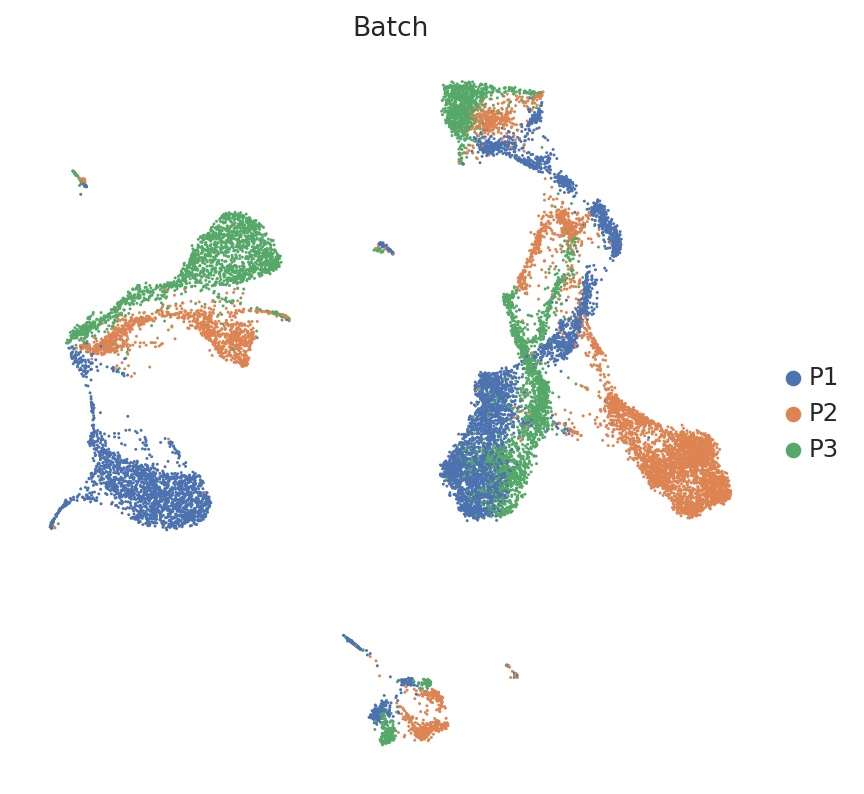

In [ ]:
sc.pl.umap(adata, color="donor", frameon=False, title="Batch")

In [ ]:
sc.pp.neighbors(adata, use_rep=SCVI_LATENT_KEY)
sc.tl.umap(adata, min_dist=0.3)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:07)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:17)


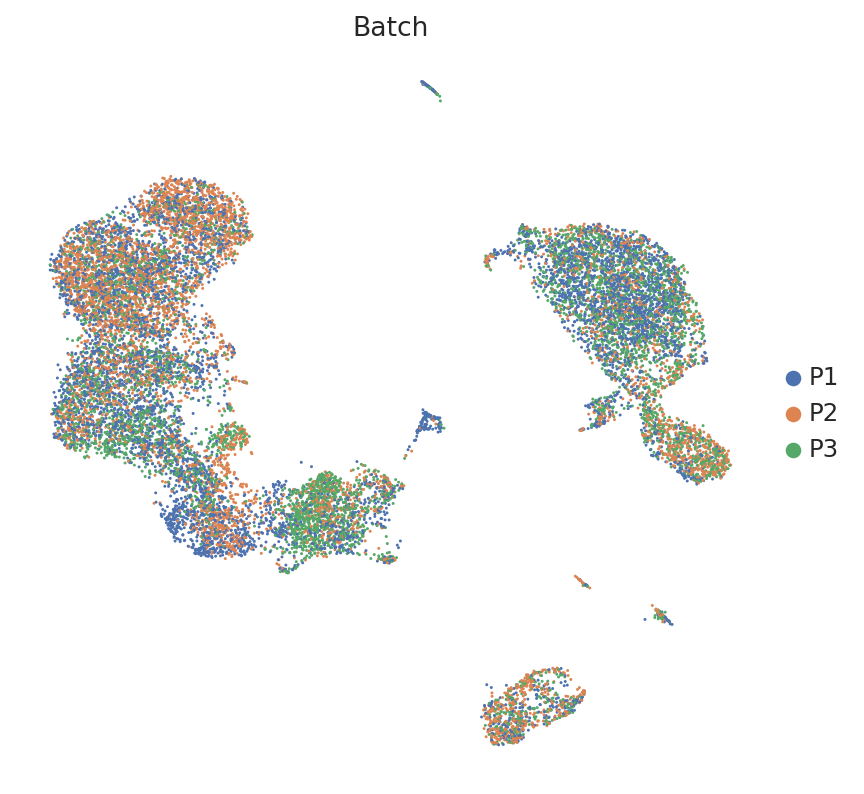

In [ ]:
sc.pl.umap(adata, color="donor", frameon=False, title="Batch")

### combat

In [ ]:
!echo "deb http://security.ubuntu.com/ubuntu focal-security main" | sudo tee /etc/apt/sources.list.d/focal-security.list
!apt-get update
!apt-get install libgmp3-dev libcairo2-dev libharfbuzz-dev libfribidi-dev libssl1.1

!pip install --upgrade gdown
!gdown 1XAbJa_suP-WFTKK628oM9EWsV7k-6fI9
!gdown 1Bt4HDrZqFId_7Ph99pSvhfFHxyrV-kaL
!tar xf library.tar.gz
%load_ext rpy2.ipython
%R .libPaths("usr/local/lib/R/site-library/")
!Rscript -e 'install.packages("statmod")'
!Rscript -e 'install.packages("VennDiagram")'

deb http://security.ubuntu.com/ubuntu focal-security main
Hit:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:2 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:3 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:4 http://security.ubuntu.com/ubuntu jammy-security InRelease
Hit:5 http://archive.ubuntu.com/ubuntu jammy-updates InRelease
Hit:6 http://security.ubuntu.com/ubuntu focal-security InRelease
Hit:7 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Ign:9 https://r2u.stat.illinois.edu/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:11 https://r2u.stat.illinois.edu/ubuntu jammy Release
Hit:12 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Reading package lists... Done
W: Skipping acquire of configured file 'main/source/Sources' as repository 'h

In [ ]:
%load_ext rpy2.ipython
%R .libPaths("usr/local/lib/R/site-library/")
#!Rscript -e 'install.packages("statmod")'
#!Rscript -e 'install.packages("VennDiagram")'

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


'/content/...,'/usr/loca...,'/usr/lib/...,'/usr/lib/...


In [ ]:
   !apt-get update
   !apt-get install r-base-dev libcurl4-openssl-dev libxml2-dev libssl-dev
   !R -e "install.packages('BiocManager')"
   !R -e "BiocManager::install('sva')"

Hit:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:3 http://security.ubuntu.com/ubuntu jammy-security InRelease
Hit:4 http://security.ubuntu.com/ubuntu focal-security InRelease
Hit:5 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:6 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:7 http://archive.ubuntu.com/ubuntu jammy-updates InRelease
Hit:8 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Ign:9 https://r2u.stat.illinois.edu/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Hit:11 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:12 https://r2u.stat.illinois.edu/ubuntu jammy Release
Reading package lists... Done
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does 

In [ ]:
#%R install.packages("genefilter")
%R library(sva)


 namespace ‘MatrixGenerics’ 1.10.0 is being loaded, but >= 1.11.1 is required





Error: package ‘genefilter’ could not be loaded


In [ ]:
%load_ext rpy2.ipython
%R install.packages("MatrixGenerics")  # This will update to the latest version
%R library(sva)  # Try loading 'sva' again

(as ‘lib’ is unspecified)



The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython



 namespace ‘MatrixGenerics’ 1.10.0 is being loaded, but >= 1.11.1 is required




A version of this package for your version of R might be available elsewhere,
see the ideas at
https://cran.r-project.org/doc/manuals/r-patched/R-admin.html#Installing-packages 




Error: package ‘genefilter’ could not be loaded


R победил меня...(

В целом все устраняет batch эффект, модели которые требует некоторые знание лучше его устраняют :)


## Task 2

Using [Cellxgene Portal](https://cellxgene.cziscience.com/) choose the dataset of your scientific interest (keep only 5-6 batches) and try to reproduce the clustering with corresponding cell types. Does it agree with provided cell type annotation?

In [ ]:
!pip install scanpy[leiden] harmonypy symphonypy
!gdown "https://datasets.cellxgene.cziscience.com/dea35fd3-c576-4ca5-9c10-72546e312b2e.h5ad"

ERROR: Operation cancelled by user
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pip/_vendor/pkg_resources/__init__.py", line 3108, in _dep_map
    return self.__dep_map
  File "/usr/local/lib/python3.10/dist-packages/pip/_vendor/pkg_resources/__init__.py", line 2901, in __getattr__
    raise AttributeError(attr)
AttributeError: _DistInfoDistribution__dep_map

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/base_command.py", line 169, in exc_logging_wrapper
    status = run_func(*args)
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/req_command.py", line 242, in wrapper
    return func(self, options, args)
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/commands/install.py", line 441, in run
    conflicts = self._determine_conflicts(to_install)
  File "/usr/local/lib/python3.10/dist-packages/pip/_i

In [ ]:
adata = sc.read_h5ad("dea35fd3-c576-4ca5-9c10-72546e312b2e.h5ad")

In [ ]:
adata_dow = adata.copy()

In [ ]:
adata.obs["donor_id"].unique()

['pooled_Control_P5', 'pooled_Deprived_P5', 'pooled_Control_P7', 'pooled_Deprived_P7']
Categories (4, object): ['pooled_Deprived_P5', 'pooled_Control_P5', 'pooled_Deprived_P7',
                         'pooled_Control_P7']

In [ ]:
adata.obs

,nCount_RNA,nFeature_RNA,percent.mito,sample_description,full_description,author_age,condition,final_clusters,S.Score,G2M.Score,...,is_primary_data,cell_type,assay,disease,organism,sex,tissue,self_reported_ethnicity,development_stage,observation_joinid
AAACCCAAGCAACAAT-LD5RC,27795.0,5846,3.248786,Control_P5,Control_P5_Male,P5,Control,5,0.126736,-0.137310,...,True,microglial cell,10x 3' v3,normal,Mus musculus,unknown,barrel cortex,na,Theiler stage 28,zu|FuL3|dc
AAACCCAGTGCCTTTC-LD5RC,13322.0,3800,4.466296,Control_P5,Control_P5_Male,P5,Control,6,-0.241861,0.081766,...,True,microglial cell,10x 3' v3,normal,Mus musculus,male,barrel cortex,na,Theiler stage 28,g``Z{%vrX;
AAACGAAAGGTGGGTT-LD5RC,20932.0,4423,4.318746,Control_P5,Control_P5_Female,P5,Control,5,-0.233135,-0.341048,...,True,microglial cell,10x 3' v3,normal,Mus musculus,female,barrel cortex,na,Theiler stage 28,rkP)cIvdeQ
AAACGAACAACAAGAT-LD5RC,12784.0,3540,3.590426,Control_P5,Control_P5_Male,P5,Control,5,-0.177494,-0.277295,...,True,microglial cell,10x 3' v3,normal,Mus musculus,unknown,barrel cortex,na,Theiler stage 28,`FBXeJW8*0
AAACGAAGTAGCTGTT-LD5RC,16980.0,4497,4.428740,Control_P5,Control_P5_Female,P5,Control,5,-0.286376,-0.403417,...,True,microglial cell,10x 3' v3,normal,Mus musculus,female,barrel cortex,na,Theiler stage 28,<YJ1HJ+Yj9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGAGGTTGTGTAC-LD7LD,10198.0,2604,4.775446,Deprived_P7,Deprived_P7_Female,P7,Deprived,6,-0.193503,-0.300448,...,True,microglial cell,10x 3' v3,normal,Mus musculus,unknown,barrel cortex,na,Theiler stage 28,nmA?&=<&hg
TTTGGTTCACGGTGTC-LD7LD,17160.0,4372,4.970862,Deprived_P7,Deprived_P7_Female,P7,Deprived,5,0.003016,-0.344770,...,True,microglial cell,10x 3' v3,normal,Mus musculus,female,barrel cortex,na,Theiler stage 28,6+(@%KV~o0
TTTGGTTGTTATGTCG-LD7LD,18691.0,4911,6.923118,Deprived_P7,Deprived_P7_Female,P7,Deprived,3,-0.245387,-0.370500,...,True,microglial cell,10x 3' v3,normal,Mus musculus,female,barrel cortex,na,Theiler stage 28,GyS>~9qQC-
TTTGGTTTCTAGCATG-LD7LD,11938.0,3927,3.057464,Deprived_P7,Deprived_P7_Female,P7,Deprived,5,-0.011214,-0.396985,...,True,microglial cell,10x 3' v3,normal,Mus musculus,female,barrel cortex,na,Theiler stage 28,L@E8~J=k?V


In [ ]:
sc.pp.neighbors(adata)
sc.tl.leiden(adata)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
running Leiden clustering
    finished: found 14 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:12)


In [ ]:
import bbknn
bbknn.bbknn(adata, batch_key='donor_id')

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)


computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)


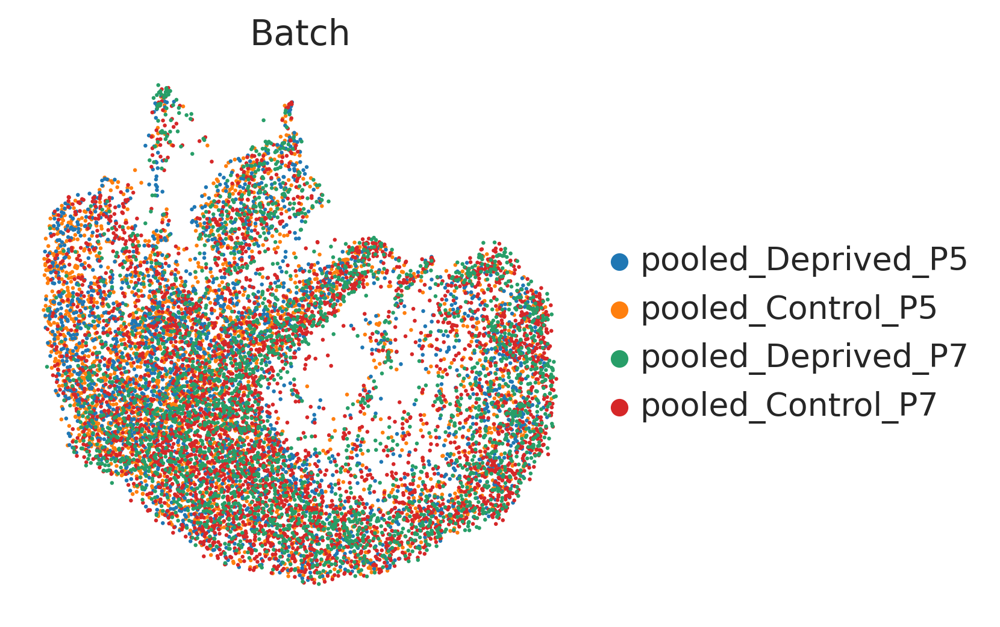

In [ ]:
sc.tl.umap(adata)
sc.pl.umap(adata, color="donor_id", frameon=False, title="Batch")

In [ ]:
sc.tl.rank_genes_groups(adata, groupby="leiden", method="wilcoxon")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:07)


In [ ]:
df = sc.get.rank_genes_groups_df(adata, group=None)
df[df.logfoldchanges > 6].head(10)

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,0,ENSMUSG00000015243,28.519503,6.518955,6.713540e-179,3.773501e-176
1,0,ENSMUSG00000022108,27.604820,40.573978,9.739022e-168,4.316072e-165
3,0,ENSMUSG00000064373,23.780241,23.814953,5.348310e-125,1.100462e-122
4,0,ENSMUSG00000002985,23.547911,119.878120,1.318759e-122,2.491048e-120
6,0,ENSMUSG00000059498,21.646013,7.355632,6.627174e-104,8.628430e-102
10,0,ENSMUSG00000021477,18.955183,22.812103,4.001528e-80,3.293400e-78
17,0,ENSMUSG00000023992,16.603041,10.368698,6.624814e-62,3.311688e-60
22,0,ENSMUSG00000021939,15.829029,20.482447,1.962254e-56,8.452365e-55
34,0,ENSMUSG00000018593,14.360615,9.034055,9.141290e-47,2.921790e-45
35,0,ENSMUSG00000027447,13.997703,38.076923,1.609904e-44,4.894490e-43


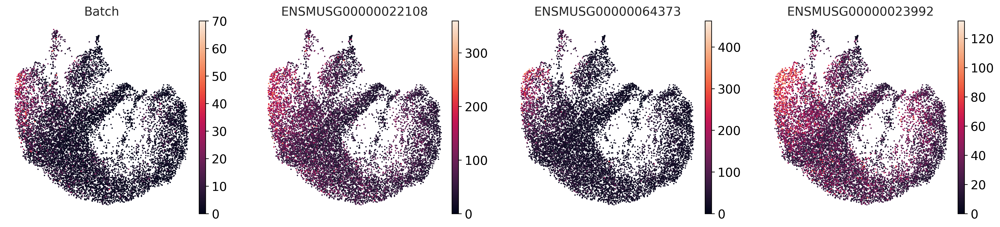

In [ ]:
sc.pl.umap(adata, color=["ENSMUSG00000015243","ENSMUSG00000022108","ENSMUSG00000064373","ENSMUSG00000023992"], frameon=False, title="Batch")

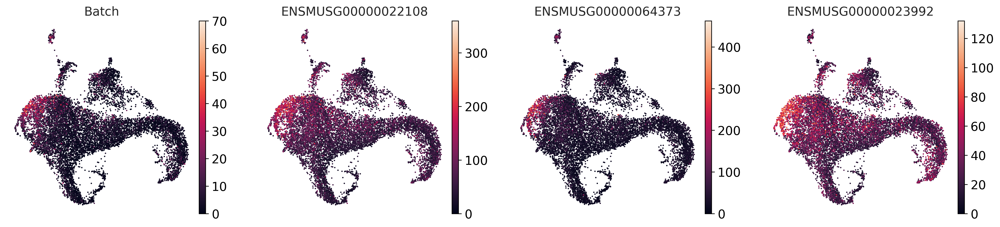

In [ ]:
sc.pl.umap(adata_dow, color=["ENSMUSG00000015243","ENSMUSG00000022108","ENSMUSG00000064373","ENSMUSG00000023992"], frameon=False, title="Batch")

Umap впринципе получился очень похожий